# SUPPORT VECTOR MACHINE

In [1]:
#Importing Necessary Libraries

In [2]:
import numpy as np
import pandas as pd
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import GridSearchCV, cross_val_score, train_test_split


import warnings
warnings.filterwarnings(action='ignore')

# Task 1: Exploratory Data Analysis (EDA)
#Import Dataset

In [3]:
df = pd.read_csv('mushroom.csv')
df.head()

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
0,1167,sunken,scaly,white,no,anise,descending,distant,broad,pink,...,partial,brown,two,sheathing,chocolate,clustered,waste,poisonous,14.276173,5.054983
1,1037,sunken,fibrous,red,no,anise,notched,crowded,narrow,chocolate,...,universal,brown,two,sheathing,brown,numerous,waste,edible,3.952715,19.068319
2,309,flat,grooves,purple,yes,foul,descending,crowded,broad,purple,...,universal,yellow,two,sheathing,purple,abundant,waste,poisonous,9.054265,7.205884
3,282,bell,scaly,pink,yes,fishy,notched,close,broad,orange,...,partial,yellow,two,cobwebby,green,clustered,grasses,poisonous,5.226499,20.932692
4,820,flat,smooth,yellow,yes,musty,free,crowded,narrow,orange,...,universal,white,none,none,yellow,clustered,urban,poisonous,14.037532,12.545245


# Data Understanding

In [4]:
df.shape

(2000, 26)

In [5]:
df.columns

Index(['Unnamed: 0', 'cap_shape', 'cap_surface', 'cap_color', 'bruises',
       'odor', 'gill_attachment', 'gill_spacing', 'gill_size', 'gill_color',
       'stalk_shape', 'stalk_root', 'stalk_surface_above_ring',
       'stalk_surface_below_ring', 'stalk_color_above_ring',
       'stalk_color_below_ring', 'veil_type', 'veil_color', 'ring_number',
       'ring_type', 'spore_print_color', 'population', 'habitat', 'class',
       'stalk_height', 'cap_diameter'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                2000 non-null   int64  
 1   cap_shape                 2000 non-null   object 
 2   cap_surface               2000 non-null   object 
 3   cap_color                 2000 non-null   object 
 4   bruises                   2000 non-null   object 
 5   odor                      2000 non-null   object 
 6   gill_attachment           2000 non-null   object 
 7   gill_spacing              2000 non-null   object 
 8   gill_size                 2000 non-null   object 
 9   gill_color                2000 non-null   object 
 10  stalk_shape               2000 non-null   object 
 11  stalk_root                2000 non-null   object 
 12  stalk_surface_above_ring  2000 non-null   object 
 13  stalk_surface_below_ring  2000 non-null   object 
 14  stalk_co

In [7]:
df.isna().sum()

Unnamed: 0                  0
cap_shape                   0
cap_surface                 0
cap_color                   0
bruises                     0
odor                        0
gill_attachment             0
gill_spacing                0
gill_size                   0
gill_color                  0
stalk_shape                 0
stalk_root                  0
stalk_surface_above_ring    0
stalk_surface_below_ring    0
stalk_color_above_ring      0
stalk_color_below_ring      0
veil_type                   0
veil_color                  0
ring_number                 0
ring_type                   0
spore_print_color           0
population                  0
habitat                     0
class                       0
stalk_height                0
cap_diameter                0
dtype: int64

# Observation:
No missing values.
No incorrect data types.

In [8]:
pd.set_option("display.max_columns", 31)
df.head()

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,stalk_shape,stalk_root,stalk_surface_above_ring,stalk_surface_below_ring,stalk_color_above_ring,stalk_color_below_ring,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
0,1167,sunken,scaly,white,no,anise,descending,distant,broad,pink,tapering,cup,smooth,silky,gray,yellow,partial,brown,two,sheathing,chocolate,clustered,waste,poisonous,14.276173,5.054983
1,1037,sunken,fibrous,red,no,anise,notched,crowded,narrow,chocolate,enlarging,rooted,silky,silky,cinnamon,brown,universal,brown,two,sheathing,brown,numerous,waste,edible,3.952715,19.068319
2,309,flat,grooves,purple,yes,foul,descending,crowded,broad,purple,tapering,cup,scaly,silky,yellow,gray,universal,yellow,two,sheathing,purple,abundant,waste,poisonous,9.054265,7.205884
3,282,bell,scaly,pink,yes,fishy,notched,close,broad,orange,enlarging,club,smooth,scaly,yellow,pink,partial,yellow,two,cobwebby,green,clustered,grasses,poisonous,5.226499,20.932692
4,820,flat,smooth,yellow,yes,musty,free,crowded,narrow,orange,enlarging,missing,fibrous,scaly,gray,white,universal,white,none,none,yellow,clustered,urban,poisonous,14.037532,12.545245


# Data Visualisation

In [9]:
y_count = df.cap_diameter.value_counts().reset_index().rename(columns={'index':'cap_diameter', 'cap_diameter':'counts'})

3.111415     8
4.988930     8
19.868822    7
18.708607    7
22.788126    7
            ..
23.894319    1
17.800033    1
20.966023    1
19.427505    1
21.056642    1
Name: cap_diameter, Length: 976, dtype: int64


<Axes: ylabel='cap_diameter'>

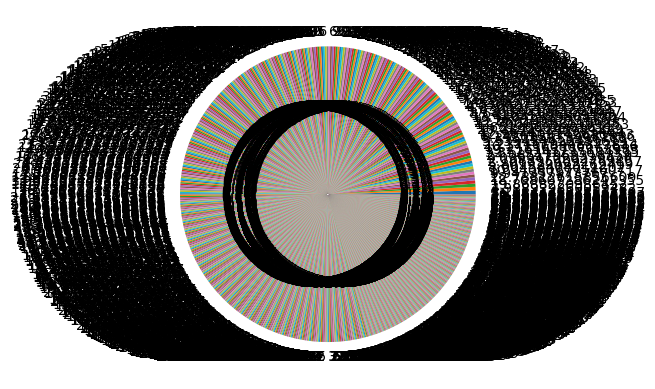

In [10]:
print(df['cap_diameter'].value_counts())
df['cap_diameter'].value_counts().plot.pie(autopct='%1.1f%%')

In [11]:
month_df = df.groupby(['cap_diameter', 'stalk_height']).size().reset_index().rename(columns={0:'count'}).sort_values('count', ascending=False)
month_df.head(10)

,cap_diameter,stalk_height,count
105,3.111415,9.825972,8
183,4.988930,8.173811,8
736,18.708607,11.782677,7
787,19.868822,11.814241,7
896,22.788126,3.846000,7
49,2.106395,5.478810,6
396,10.141367,10.905819,6
349,9.039947,12.557712,6
232,5.801929,2.316607,6
757,19.216164,14.194180,6


In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

In [13]:
df_numeric = df.drop('habitat', axis=1)

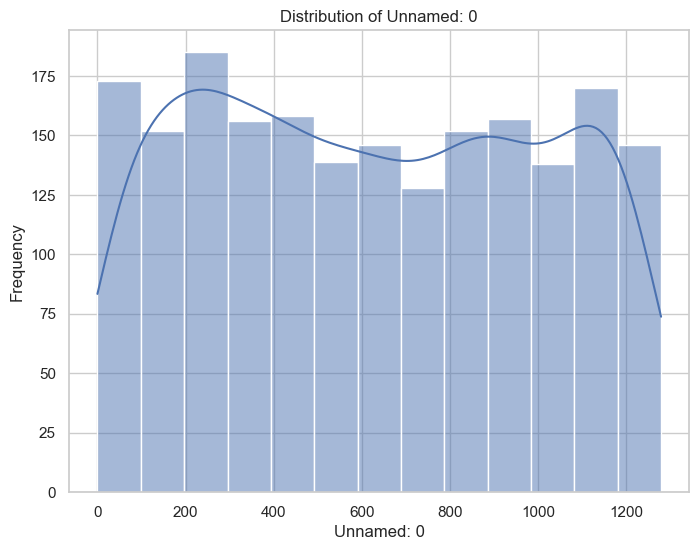

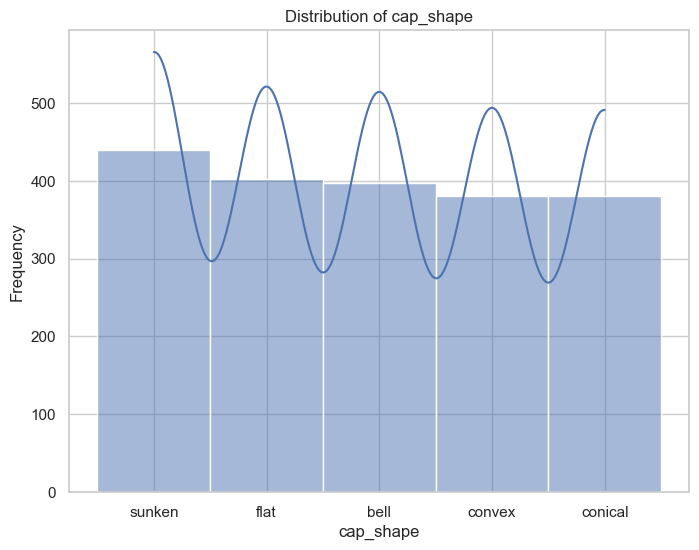

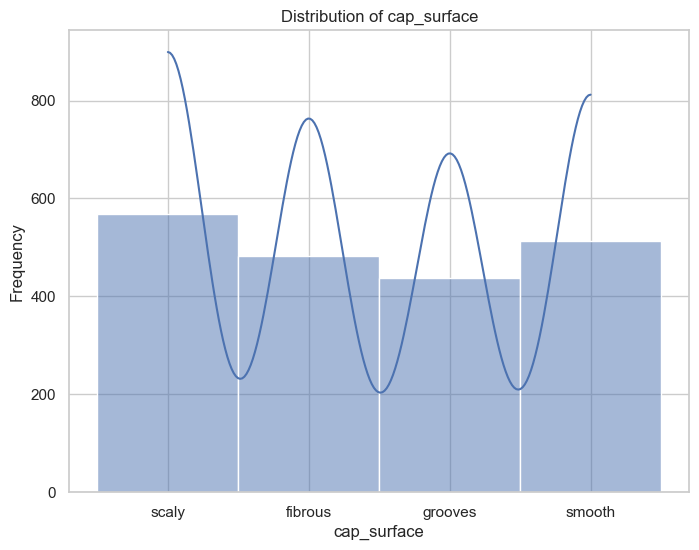

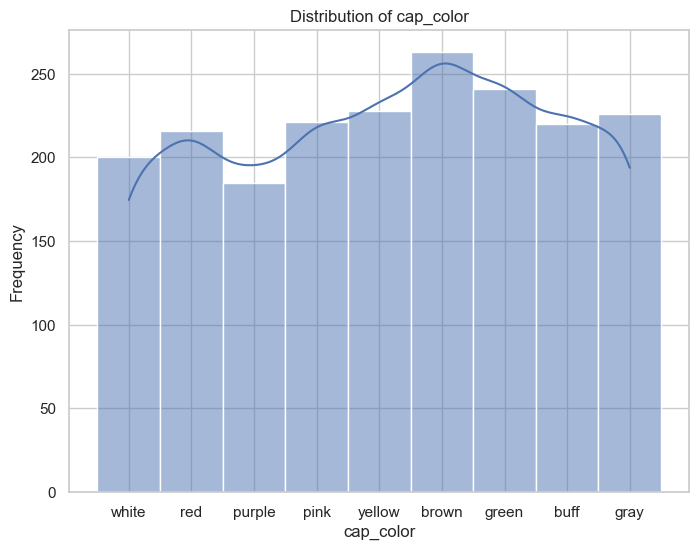

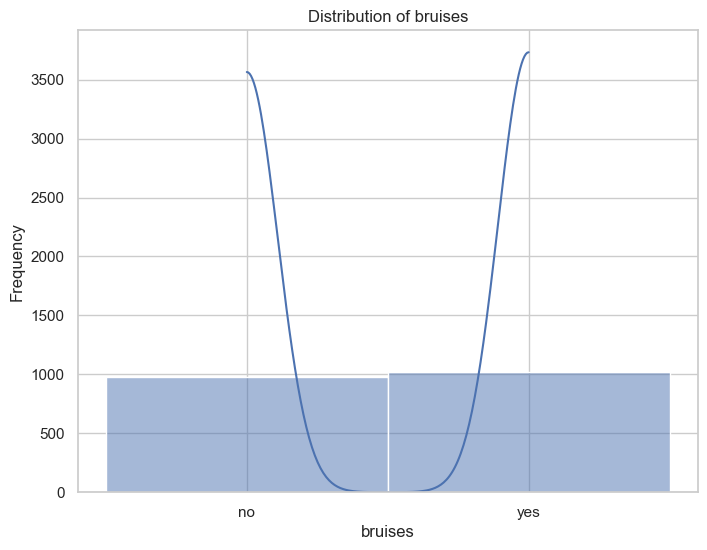

...

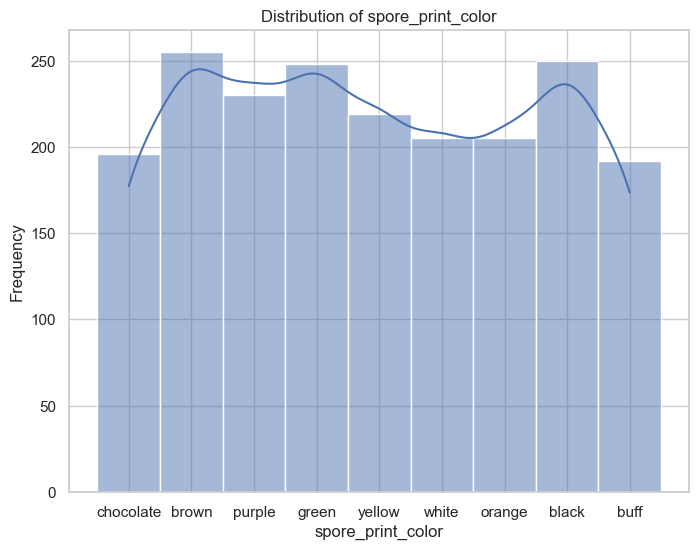

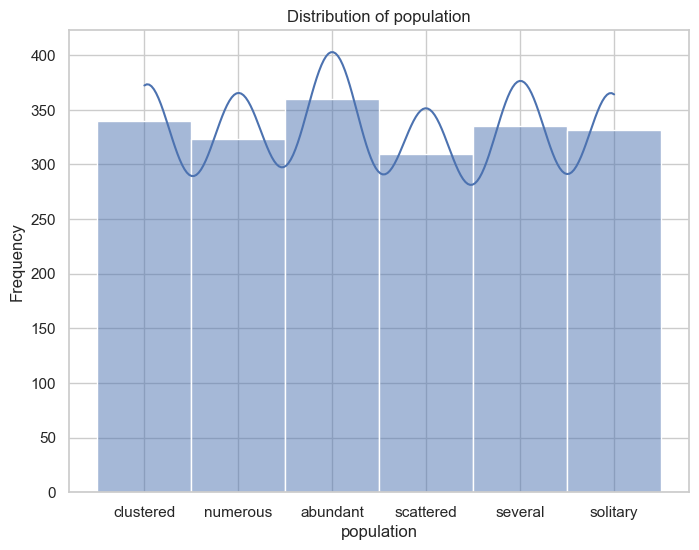

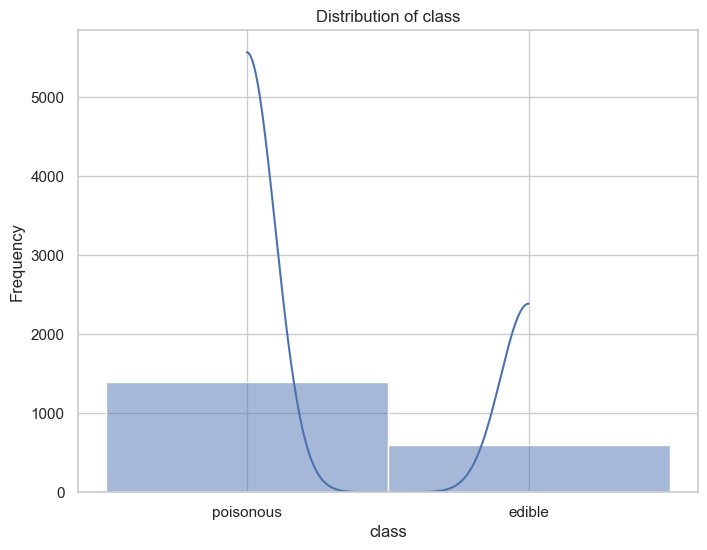

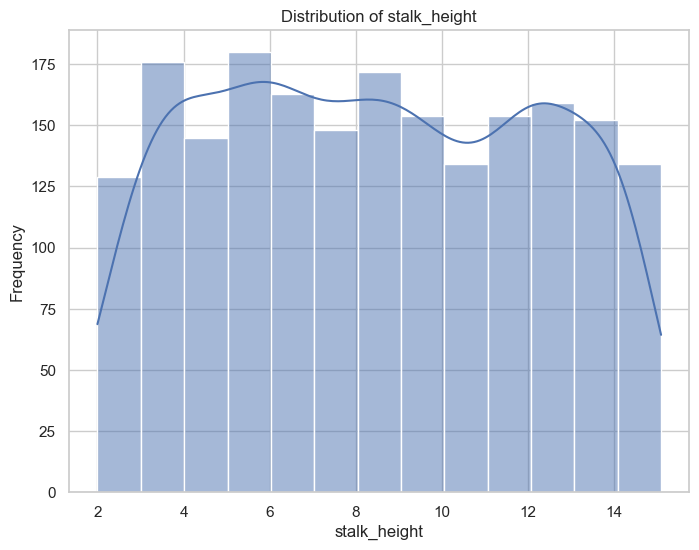

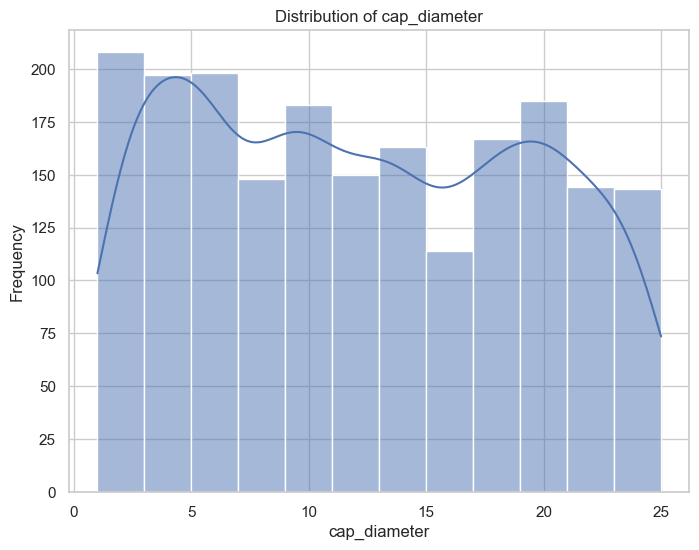

In [14]:
# Set the style
sns.set(style="whitegrid")

# Plot histograms for each numeric column
for column in df_numeric.columns:
    plt.figure(figsize=(8, 6))
    sns.histplot(df[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

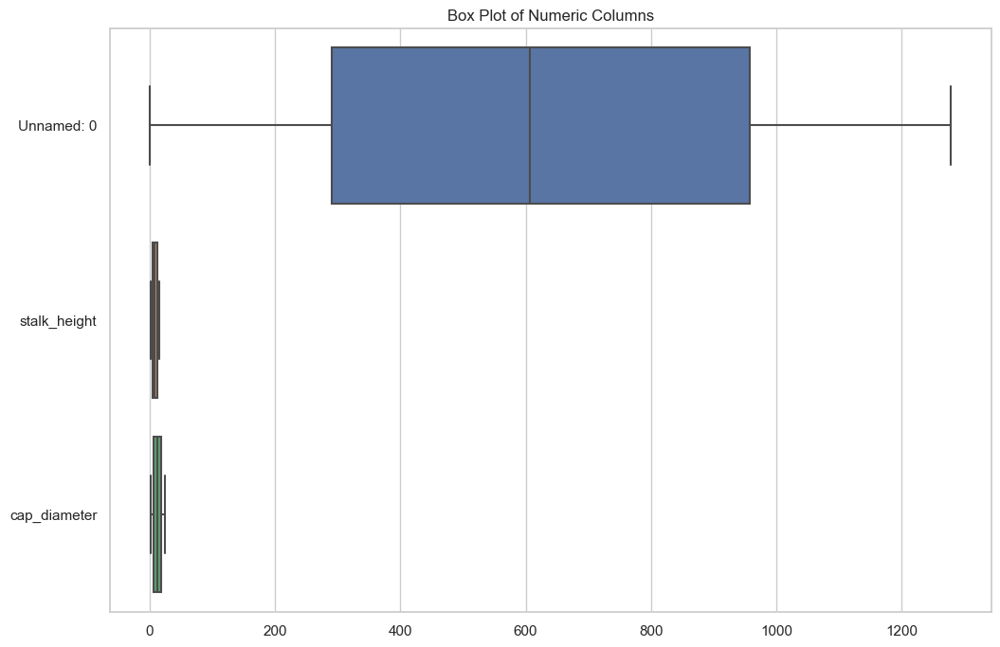

In [15]:
plt.figure(figsize=(12, 8))
sns.boxplot(data=df_numeric, orient='h')
plt.title('Box Plot of Numeric Columns')
plt.show()

In [16]:
month_df = df.groupby(['stalk_height', 'class']).size().reset_index().rename(columns={0:'count'}).sort_values('count', ascending=False)
month_df.head(10)

,stalk_height,class,count
467,8.173811,edible,8
597,9.825972,poisonous,8
734,11.814241,poisonous,7
121,3.846000,poisonous,7
731,11.782677,poisonous,7
1,2.000000,poisonous,7
16,2.316607,poisonous,6
524,8.874818,poisonous,6
173,4.477327,poisonous,6
365,6.887240,poisonous,6


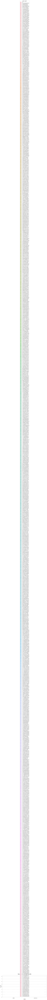

In [17]:
plt.figure(figsize=(12,6))
sns.barplot(x='class', y = 'count', hue='stalk_height', data= month_df)
plt.title("Num of fires in each month", fontsize=17, y=1.02)
plt.xlabel('class', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.show()

In [18]:
day_df = df.groupby(['stalk_height', 'habitat']).size().reset_index().rename(columns={0:'count'}).sort_values('count', ascending=False)
day_df

,stalk_height,habitat,count
469,8.173811,urban,8
599,9.825972,leaves,8
123,3.846000,leaves,7
736,11.814241,waste,7
733,11.782677,paths,7
...,...,...,...
272,5.755634,waste,1
273,5.760248,waste,1
623,10.114862,woods,1
278,5.802225,grasses,1


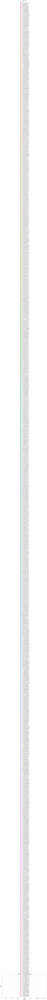

In [19]:
plt.figure(figsize=(12,6))
sns.barplot(x='habitat', y = 'count', hue='stalk_height', data= day_df)
plt.title("Num of fires on each habitat", fontsize=17, y=1.02)
plt.title("Num of fires in each height", fontsize=17, y=1.02)
plt.xlabel('habitat', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.show()

# Label Encoder

In [20]:
labelencoder = LabelEncoder()
df.iloc[:,-1] = labelencoder.fit_transform(df.iloc[:,-1])
df['stalk_height']  #1 for small, 0 for large

0       14.276173
1        3.952715
2        9.054265
3        5.226499
4       14.037532
          ...    
1995     5.877891
1996     6.500840
1997    13.558064
1998    11.092703
1999    13.066414
Name: stalk_height, Length: 2000, dtype: float64

In [21]:
rain_df = df.groupby(['stalk_height', 'class']).size().reset_index().rename(columns={0:'count'}).sort_values('count', ascending=False)
rain_df

,stalk_height,class,count
467,8.173811,edible,8
597,9.825972,poisonous,8
734,11.814241,poisonous,7
121,3.846000,poisonous,7
731,11.782677,poisonous,7
...,...,...,...
385,7.130583,poisonous,1
386,7.159937,edible,1
387,7.162837,poisonous,1
645,10.540148,poisonous,1


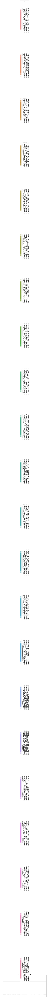

In [22]:
plt.figure(figsize=(12,6))
sns.barplot(x='class', y='count', hue='stalk_height', data= rain_df)
plt.title("class level in diff category ", y=1.02, fontsize=17)
plt.xlabel('class', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.show()

# Outliers Detection

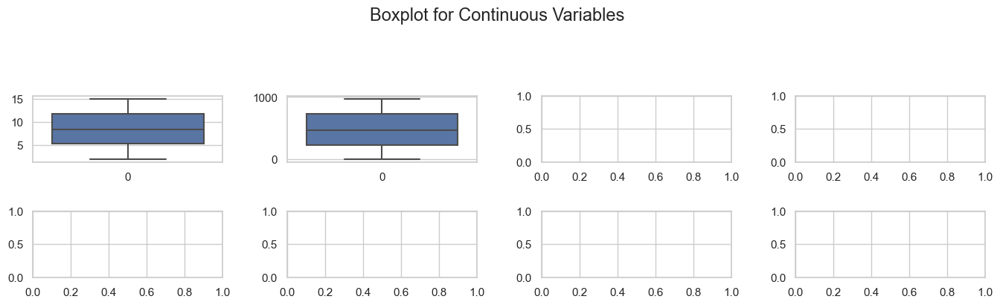

In [23]:
fig, ax=plt.subplots(2,4, figsize=(14,4), sharex= False, sharey = False)
sns.boxplot(df.stalk_height, ax=ax[0,0])
sns.boxplot(df.cap_diameter, ax=ax[0,1])
plt.suptitle("Boxplot for Continuous Variables", fontsize= 17, y = 1.06)
plt.tight_layout(pad=2.0)

In [24]:
df.columns

Index(['Unnamed: 0', 'cap_shape', 'cap_surface', 'cap_color', 'bruises',
       'odor', 'gill_attachment', 'gill_spacing', 'gill_size', 'gill_color',
       'stalk_shape', 'stalk_root', 'stalk_surface_above_ring',
       'stalk_surface_below_ring', 'stalk_color_above_ring',
       'stalk_color_below_ring', 'veil_type', 'veil_color', 'ring_number',
       'ring_type', 'spore_print_color', 'population', 'habitat', 'class',
       'stalk_height', 'cap_diameter'],
      dtype='object')

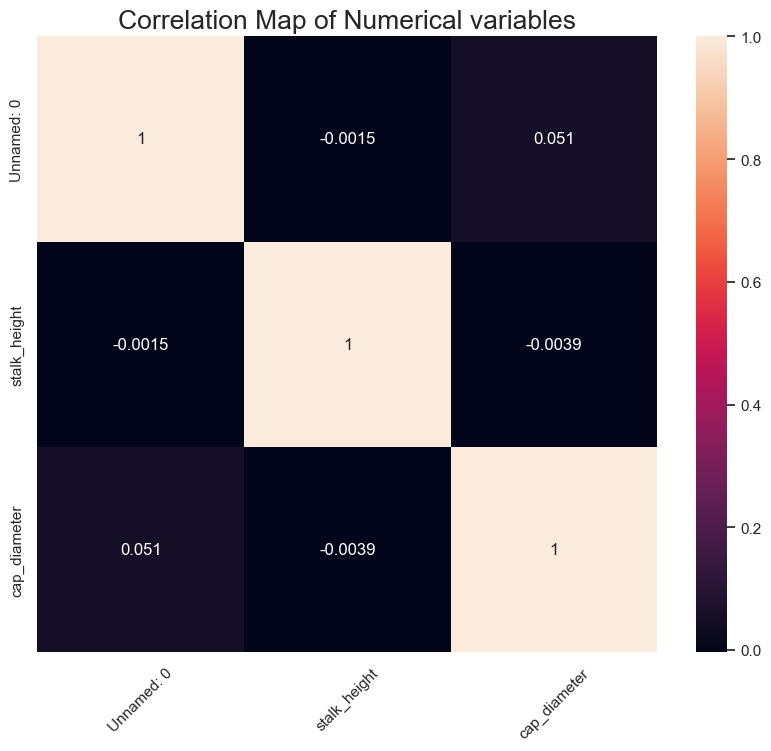

In [25]:
fig= plt.figure(figsize=(10,8))
sns.heatmap(df.corr(), annot=True);
plt.xticks(rotation=45)
plt.title("Correlation Map of Numerical variables", fontsize=19);

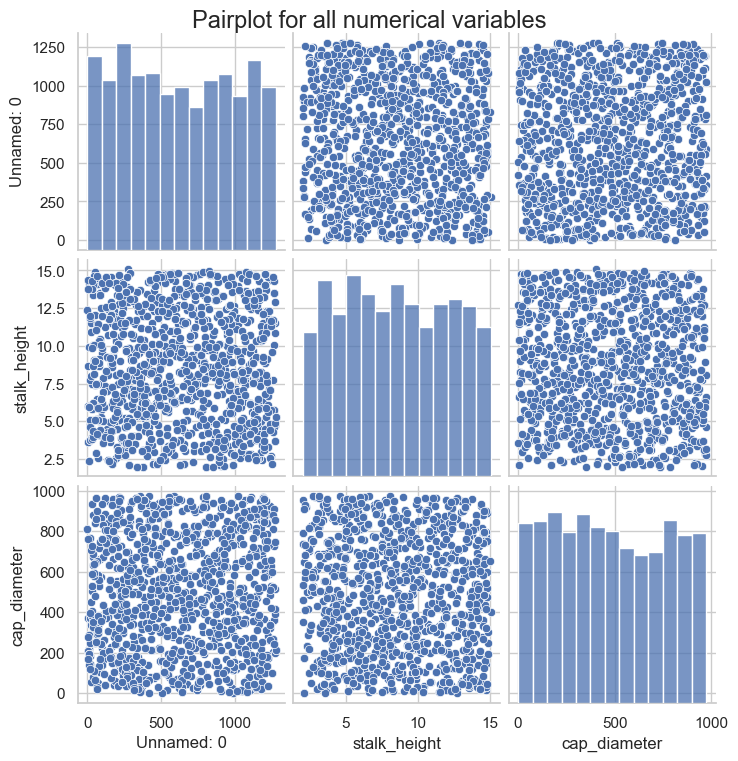

In [26]:
sns.pairplot(df)
plt.suptitle("Pairplot for all numerical variables", y = 1.01, fontsize=17)
plt.show()

# Data Preprocessing

In [27]:
#Drop the unnecessary columns

In [28]:
df.drop(['cap_shape', 'cap_surface', 'cap_color', 'bruises',
       'odor', 'gill_attachment', 'gill_spacing', 'gill_size', 'gill_color',
       'stalk_shape', 'stalk_root', 'stalk_surface_above_ring',
       'stalk_surface_below_ring', 'stalk_color_above_ring',
       'stalk_color_below_ring', 'veil_type', 'veil_color', 'ring_number',
       'ring_type', 'spore_print_color', 'population', 'habitat', 'class'], axis=1, inplace=True)

In [29]:
pd.set_option("display.max_columns", 27)
df.head()

,Unnamed: 0,stalk_height,cap_diameter
0,1167,14.276173,190
1,1037,3.952715,750
2,309,9.054265,281
3,282,5.226499,829
4,820,14.037532,484


# Check the outliers

In [30]:
from sklearn.ensemble import IsolationForest
data1=df.copy()

#training the model
clf = IsolationForest(random_state=10, contamination=.01)
clf.fit(data1)
data1['anamoly'] = clf.predict(data1.iloc[:,0:27])
outliers = data1[data1['anamoly']==-1]


In [31]:
outliers

,Unnamed: 0,stalk_height,cap_diameter,anamoly
58,987,2.084521,2,-1
106,591,2.745283,973,-1
126,1240,14.394692,925,-1
193,73,2.598369,51,-1
200,911,2.031231,954,-1
463,1182,2.969487,18,-1
607,1182,2.969487,18,-1
661,66,14.626467,897,-1
664,1115,2.857597,970,-1
735,591,2.745283,973,-1


# Observation:
*outliers dataset gives the outliers in our data, and we need to remove these to improve our model.

In [32]:
outliers.index

Int64Index([  58,  106,  126,  193,  200,  463,  607,  661,  664,  735,  886,
            1293, 1352, 1377, 1475, 1481, 1483, 1580, 1600, 1884],
           dtype='int64')

In [33]:
df.drop([ 58,  106,  126,  193,  200,  463,  607,  661,  664,  735,  886,
            1293, 1352, 1377, 1475, 1481, 1483, 1580, 1600, 1884], axis=0, inplace=True)


In [34]:
df.shape

(1980, 3)

# Splitting data into target variable and independent variables

In [35]:
x = df.drop('cap_diameter', axis=1)
y = df['cap_diameter']

# Converting independent features into normalised and standardized data

In [36]:
norm = MinMaxScaler()
std = StandardScaler()

x_norm = pd.DataFrame(norm.fit_transform(x), columns=x.columns)   # data between -3 to +3
x_std = pd.DataFrame(std.fit_transform(x), columns=x.columns)     # data between -1 to +1

In [37]:
x_std.head()

,Unnamed: 0,stalk_height
0,1.459454,1.579074
1,1.111355,-1.234781
2,-0.837999,0.155743
3,-0.910296,-0.887587
4,0.530298,1.514028


# Model Building

# Creating train and test data for model validation

In [38]:
x_train, x_test, y_train, y_test = train_test_split(x_std, y, test_size=0.25)

In [39]:
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((1485, 2), (495, 2), (1485,), (495,))

# Model Training | Testing | Evaluation

# Kernel = rbf

# SVM Implementation

In [40]:
clf = SVC()
param_grids = [{'kernel':['rbf'], 'C': [15,14,13,12,11,10,1,0.1,0.001]}]
grid = GridSearchCV(clf, param_grids, cv=3)
grid.fit(x_train,y_train)

GridSearchCV(cv=3, estimator=SVC(),
             param_grid=[{'C': [15, 14, 13, 12, 11, 10, 1, 0.1, 0.001],
                          'kernel': ['rbf']}])

In [41]:
grid.best_score_, grid.best_params_

(0.3191919191919192, {'C': 15, 'kernel': 'rbf'})

# rbf kernel with gamma as scale

In [42]:
clf=SVC(kernel='rbf', C=13, gamma = 'scale')
clf.fit(x_train, y_train)
y_pred = clf.predict(x_test)
y_pred1 = clf.predict(x_train)
acc = accuracy_score(y_pred, y_test)*100
print("Test Accuracy  =" , acc)
acc1 = accuracy_score(y_pred1, y_train)*100
print("Train Accuracy =" , acc1)
confusion_matrix(y_test, y_pred)

Test Accuracy  = 19.7979797979798
Train Accuracy = 38.78787878787879


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

# rbf kernel with gamma as auto

In [43]:
clf=SVC(kernel='rbf', C=13, gamma = 'auto')
clf.fit(x_train, y_train)
y_pred = clf.predict(x_test)
y_pred1 = clf.predict(x_train)
acc = accuracy_score(y_pred, y_test)*100
print("Test Accuracy  =" , acc)
acc1 = accuracy_score(y_pred1, y_train)*100
print("Train Accuracy =" , acc1)
confusion_matrix(y_test, y_pred)

Test Accuracy  = 19.7979797979798
Train Accuracy = 38.78787878787879


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

# Kernel = Polynomial

In [44]:
clf = SVC()
param_grids = [{'kernel':['poly'], 'degree':[0,1,2,3,4,5,6], 'C': [15,14,13,12,11,10,1,0.1,0.001]}]
grid = GridSearchCV(clf, param_grids, cv=3)
grid.fit(x_train,y_train)

GridSearchCV(cv=3, estimator=SVC(),
             param_grid=[{'C': [15, 14, 13, 12, 11, 10, 1, 0.1, 0.001],
                          'degree': [0, 1, 2, 3, 4, 5, 6],
                          'kernel': ['poly']}])

In [45]:
grid.best_score_, grid.best_params_

(0.4134680134680135, {'C': 15, 'degree': 5, 'kernel': 'poly'})

In [46]:
clf_p=SVC(kernel='poly', C=15, degree =1 )
clf_p.fit(x_train, y_train)
y_pred_p = clf_p.predict(x_test)
y_pred1 = clf_p.predict(x_train)
acc = accuracy_score(y_pred, y_test)*100
print("Test Accuracy  =" , acc)
acc1 = accuracy_score(y_pred1, y_train)*100
print("Train Accuracy =" , acc1)
confusion_matrix(y_test, y_pred_p)

Test Accuracy  = 19.7979797979798
Train Accuracy = 29.83164983164983


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

# Kernel = Linear

In [47]:
clf = SVC()
param_grids = [{'kernel':['linear'], 'C': [15,14,13,12,11,10,1,0.1,0.001]}]
grid = GridSearchCV(clf, param_grids, cv=3)
grid.fit(x_train,y_train)

GridSearchCV(cv=3, estimator=SVC(),
             param_grid=[{'C': [15, 14, 13, 12, 11, 10, 1, 0.1, 0.001],
                          'kernel': ['linear']}])

In [48]:
grid.best_score_, grid.best_params_

(0.32255892255892255, {'C': 15, 'kernel': 'linear'})

In [49]:
clf_l=SVC(kernel='linear', C=11)
clf_l.fit(x_train, y_train)
y_pred_l = clf_l.predict(x_test)
acc = accuracy_score(y_pred_l, y_test)*100
y_pred1 = clf_l.predict(x_train)
acc1= accuracy_score(y_pred1, y_train)*100
print("Test Accuracy  =" , acc)
print("Train Accuracy =", acc1)
confusion_matrix(y_test, y_pred_l)

Test Accuracy  = 18.98989898989899
Train Accuracy = 36.83501683501684


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

# Conclusion

# It is clearly evident that our linear kernel model of SVC is giving us the highest accuracy.

Hence we will be using it as our model.


In [50]:
from sklearn.preprocessing import LabelEncoder

In [51]:
le = LabelEncoder()
df.iloc[:,-1] = le.fit_transform(df.iloc[:,-1])

In [52]:
from sklearn.svm import SVC

In [53]:
svc = SVC() # use default values because data is in good forma

In [54]:
from sklearn.model_selection import train_test_split

In [55]:
x = df.iloc[:,:-1]
y = df['stalk_height']

In [56]:
y

0       14.276173
1        3.952715
2        9.054265
3        5.226499
4       14.037532
          ...    
1995     5.877891
1996     6.500840
1997    13.558064
1998    11.092703
1999    13.066414
Name: stalk_height, Length: 1980, dtype: float64

In [57]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.25,random_state=0)

In [58]:
y_train

1616     5.865708
307     14.767248
544     14.164756
1053     3.528000
174     10.855816
          ...    
845     13.523915
1227     7.792132
1672    14.582213
565     14.003338
693      9.273318
Name: stalk_height, Length: 1485, dtype: float64

In [59]:
y_train = le.fit_transform(y_train)

In [60]:
df['stalk_height'].unique()

array([14.27617297,  3.95271464,  9.05426531,  5.2264987 , 14.03753182,
        4.33704349, 12.70235895, 11.9636904 , 14.27248994, 11.84259749,
        3.7629686 , 13.75032738,  9.2519791 ,  2.96199671,  8.25004458,
        3.68639733,  5.29100891, 11.95186307,  8.79104375, 13.59609835,
       13.57209131,  8.68800754,  8.09116082,  8.43665118,  5.79608432,
       11.56649675,  6.20076271, 14.79148759,  3.84600018, 13.21400655,
        3.18908171,  7.86552213,  6.94724803, 10.4250167 , 10.57354282,
        4.59431989,  4.85090697, 10.90581874,  8.17381121,  6.88529014,
        5.96008946, 12.49368466,  5.14424113, 12.55968049,  4.74645301,
       13.95547016,  4.11495491, 12.32821463, 10.94337594, 12.20695208,
        8.33875451, 10.47571867,  9.26636737, 13.08826016, 13.19653224,
        5.33686834,  9.65328894,  3.59494407, 10.52019449,  7.21132375,
       10.11662118,  7.75540965,  7.32806537,  5.09954065,  9.23471831,
       13.76703438,  8.866765  ,  5.86570806,  9.27315224,  4.90

In [61]:
svc.fit(x_train,y_train)

SVC()

In [62]:
ypred = svc.predict(x_test)

In [63]:
ypred

array([  0,   0,   0,   0, 519, 519, 636,  11, 636, 636, 519,   0,  11,
       636, 519, 453,   0,   0,   0, 636, 636,   0,  11,   0,   0,   0,
       636, 636,   0, 636, 453, 636, 519, 453, 453,   0, 636, 636,   0,
         0,   0,   0, 519, 519,   0,   0, 519,   0,   0,   0,   0, 636,
         0, 636, 519,  11,   0, 636, 636,   0,   0,   0, 101,   0,  11,
       519, 519, 453, 636, 636, 636, 453,  11, 453, 453,   0, 636, 636,
         0,  11, 636,   0,   0,   0, 636, 636, 101, 636, 519, 636, 636,
         0,   0, 519,  11,  11,   0, 453,   0, 453,   0, 636,  11,   0,
       636, 636, 519,   0, 453, 453,   0, 453, 636,   0,   0,   0, 636,
       519,  11,   0,   0, 453,   0, 453, 636,   0,  11,   0, 519,   0,
         0, 519, 636,  11, 636, 636,   0,   0,   0,  11, 453,   0,   0,
         0, 636,   0,   0, 519,   0,  11, 519, 636,   0,   0, 636,  11,
       519,   0,  11, 519, 636,   0, 453, 636, 519,   0,   0, 519,   0,
         0,   0, 636, 519, 519,   0,   0,   0, 519, 519, 636, 63

In [64]:
from sklearn.metrics import classification_report

In [65]:
y_test = le.fit_transform(y_test)

In [66]:
print(classification_report(y_test,ypred))

              precision    recall  f1-score   support

           0       0.00      1.00      0.01         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         1
           4       0.00      0.00      0.00         1
           5       0.00      0.00      0.00         1
           6       0.00      0.00      0.00         1
           7       0.00      0.00      0.00         1
           8       0.00      0.00      0.00         1
           9       0.00      0.00      0.00         1
          10       0.00      0.00      0.00         1
          11       0.00      0.00      0.00         1
          12       0.00      0.00      0.00         1
          13       0.00      0.00      0.00         2
          14       0.00      0.00      0.00         3
          15       0.00      0.00      0.00         1
          16       0.00      0.00      0.00         1
          17       0.00    

In [67]:
print(svc.score(x_train,y_train),svc.score(x_test,y_test))

0.020875420875420877 0.00202020202020202


# Hyperparameter Tuning

In [68]:
from sklearn.model_selection import GridSearchCV

In [69]:
params = {
    'C' : [0.1,0.001,1,2,3,4,5],
    'kernel' : ['linear','poly','rbf'],
    'gamma' : [0.1,0.001,1,2,5]
} 

In [70]:
grid = GridSearchCV(SVC(),param_grid=params,verbose=1) # try verbose = 0

In [71]:
x_train

,Unnamed: 0,stalk_height
1616,532,5.865708
307,1032,14.767248
544,102,14.164756
1053,1006,3.528000
174,1187,10.855816
...,...,...
845,83,13.523915
1227,1220,7.792132
1672,500,14.582213
565,456,14.003338


In [73]:
svc = SVC(C=0.1,gamma=0.1,kernel='poly')

In [74]:
svc.fit(x_train,y_train)
ypred = svc.predict(x_test)

In [90]:
print('Training Accuracy',svc.score(x_train,y_train))
print('Testing Accuracy',svc.score(x_test,y_test))

Training Accuracy 1.0
Testing Accuracy 0.00404040404040404


In [91]:
dict = { 'cap_diameter': [3.5,3.0,3.2,3.0,2.5,3.0],'Unnamed:0': [3.5,3.0,3.2,3.0,2.5,3.0]}

In [92]:
newdata = pd.DataFrame(dict)

In [94]:
svc.predict(x)

array([794, 108, 465, ..., 746, 593, 552], dtype=int64)